<a href="https://colab.research.google.com/github/riskakurniaa/PCVK_Ganjil_2024/blob/main/Vegetable.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Riska Kurnia Triwulandari / 25 / 2241720039

# Import Library

In [ ]:
import os
import matplotlib.pyplot as plt
import numpy as np

#load data
from google.colab import files
import random

#modelling
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import GlobalAveragePooling2D
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dense, Dropout, BatchNormalization
from sklearn.metrics import classification_report

In [ ]:
# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# EDA

In [ ]:
#get images
train_datagen = ImageDataGenerator(rescale=1./255.)
test_datagen = ImageDataGenerator(rescale=1./255.)
val_datagen = ImageDataGenerator(rescale=1./255.)

#see how many images and classes in this dataset
print('Train Set')
train_gen = train_datagen.flow_from_directory(
	"/content/drive/MyDrive/PCVK/Vegetable Images/train",
	target_size=(150,150),
	class_mode='categorical',
  batch_size=126
)

print('\nTest Set')
test_gen = test_datagen.flow_from_directory(
	"/content/drive/MyDrive/PCVK/Vegetable Images/test",
	target_size=(150,150),
	class_mode='categorical',
  batch_size=126,
	shuffle = False
)

print('\nVal Set')
val_gen = val_datagen.flow_from_directory(
	"/content/drive/MyDrive/PCVK/Vegetable Images/validation",
	target_size=(150,150),
	class_mode='categorical',
  batch_size=126,
	shuffle = False
)

Train Set
Found 15000 images belonging to 15 classes.

Test Set
Found 3000 images belonging to 15 classes.

Val Set
Found 3000 images belonging to 15 classes.


Terdapat 15.000 gambar pada train set, 3.000 gambar masing-masing pada test set dan validation set. pada data ini ada 15 jenis sayuran yang akan dilakukan modelling dan prediksi.

In [ ]:
train_dir = '/content/drive/MyDrive/PCVK/Vegetable Images/train'
train_ds = tf.keras.utils.image_dataset_from_directory(
  train_dir,
  seed=0,
  image_size=(150, 150),
  batch_size=15)

#show class names
class_names = train_ds.class_names
class_names

Found 15000 files belonging to 15 classes.


['Bean',
 'Bitter_Gourd',
 'Bottle_Gourd',
 'Brinjal',
 'Broccoli',
 'Cabbage',
 'Capsicum',
 'Carrot',
 'Cauliflower',
 'Cucumber',
 'Papaya',
 'Potato',
 'Pumpkin',
 'Radish',
 'Tomato']

15 jenis/kelas sayuran tersebut terdiri dari Bean, Bitter_Gourd, Bottle_Gourd Brinjal, Broccoli, Cabbage, Capsicum, Carrot, Cauliflower, Cucumber, Papaya, Potato, Pumpkin, Radish, dan Tomato. Selanjutnya akan dilakukan sampling gambar yang menunjukkan bentuk sayuran dari masing-masing kelas.

Bean


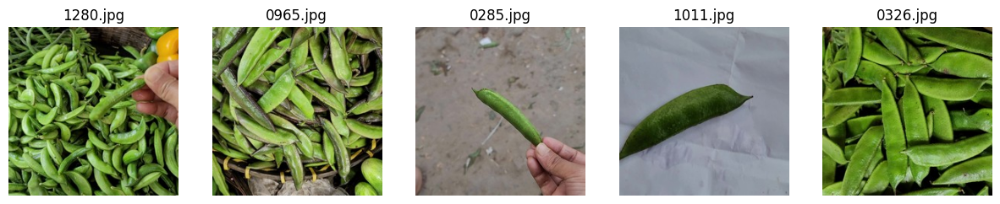

Bitter_Gourd


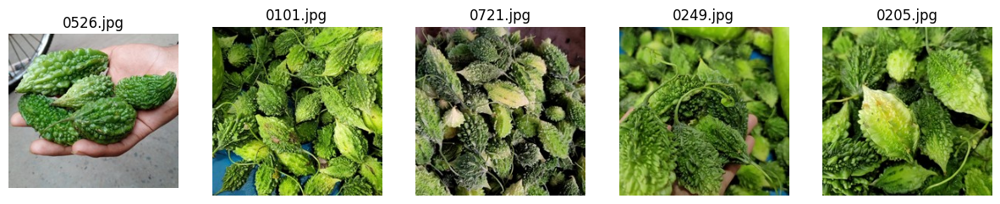

Bottle_Gourd


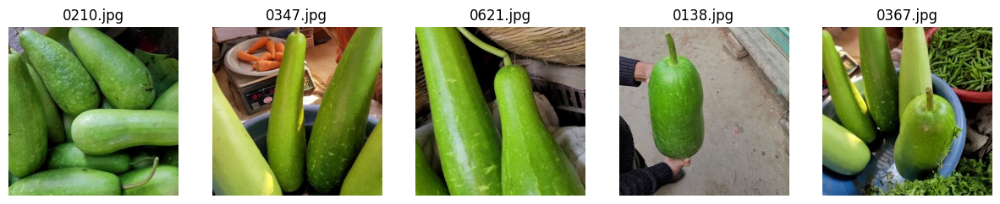

Brinjal


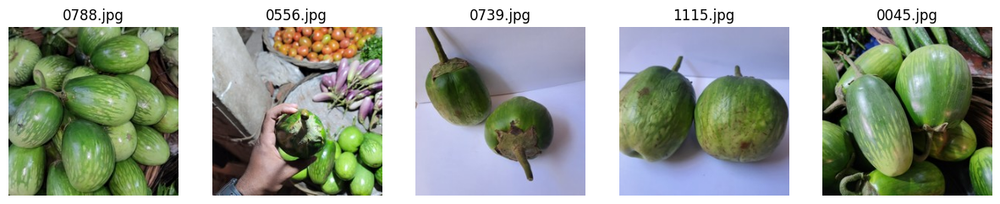

Broccoli


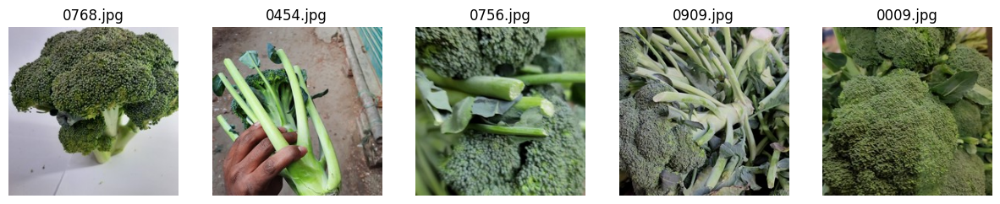

Cabbage


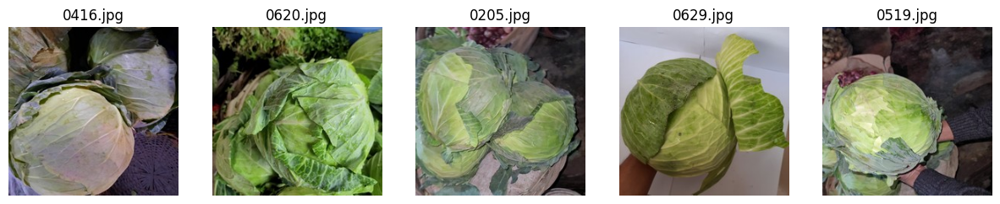

Capsicum


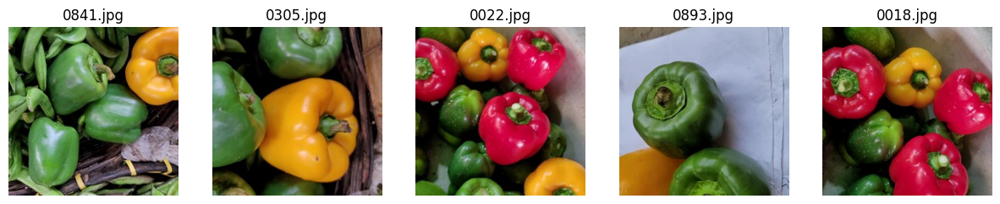

Carrot


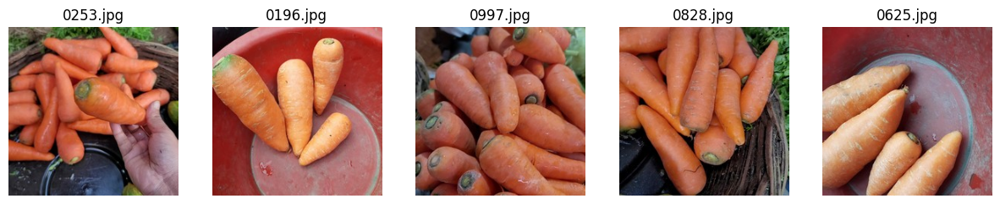

Cauliflower


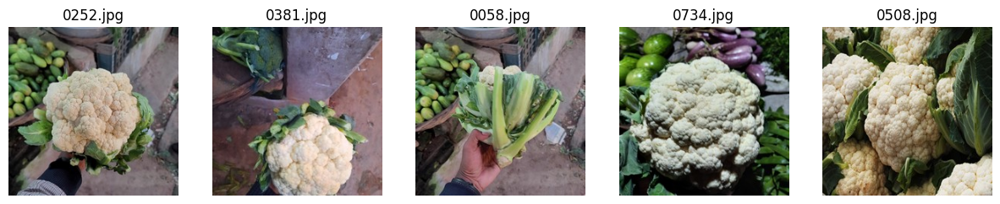

Cucumber


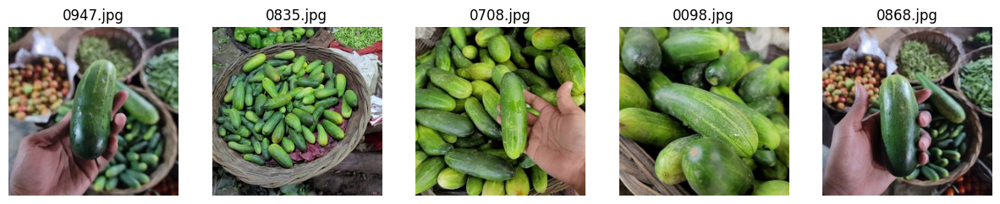

Papaya


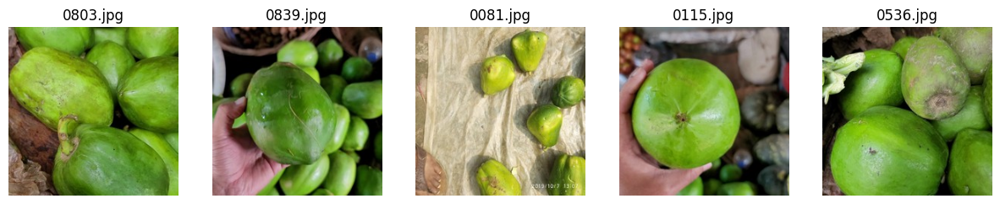

Potato


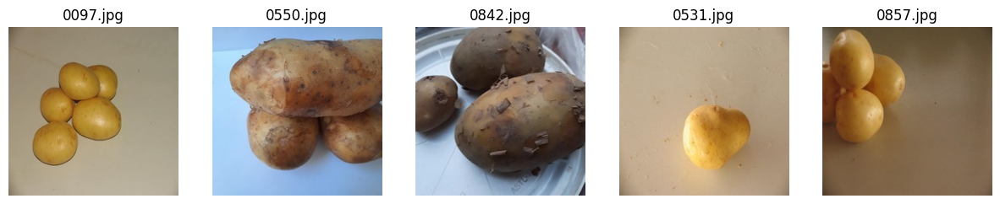

Pumpkin


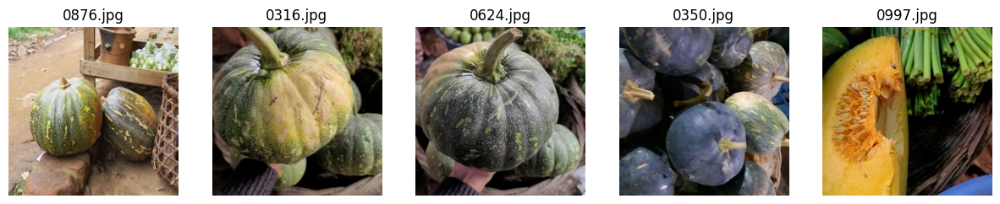

Radish


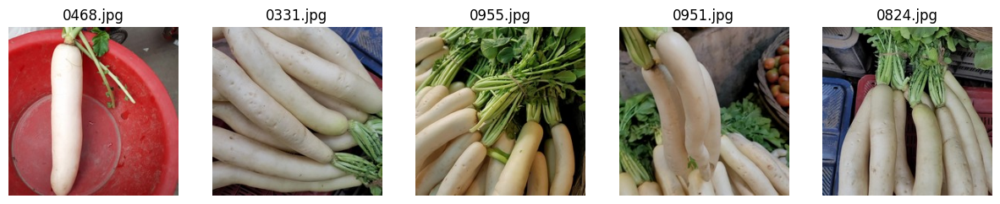

Tomato


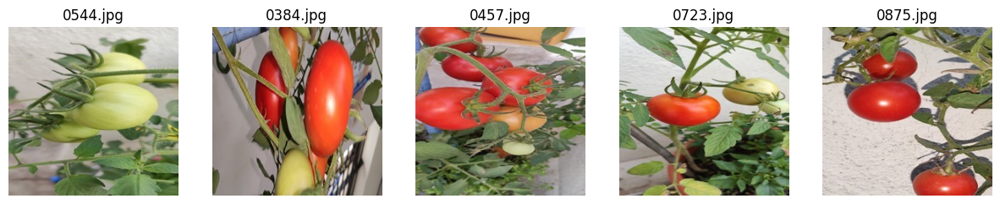

In [ ]:
#file direction
file_path = '/content/drive/MyDrive/PCVK/Vegetable Images/train'

#defining function
def show_images_from_folder_with_title(folder_path, num_images=5):
    plt.figure(figsize=(15, 8))
    image_files = os.listdir(folder_path)
    for i in range(num_images):
        random_image = random.choice(image_files)
        img_path = os.path.join(folder_path, random_image)
        img = plt.imread(img_path)
        plt.subplot(1, num_images, i+1)
        plt.imshow(img)
        plt.title(random_image)
        plt.axis('off')
    plt.show()

#visualize
print('Bean')
bean_folder = os.path.join(file_path, 'Bean')
show_images_from_folder_with_title(bean_folder, num_images=5)
print('Bitter_Gourd')
bittergourd_folder = os.path.join(file_path, 'Bitter_Gourd')
show_images_from_folder_with_title(bittergourd_folder, num_images=5)
print('Bottle_Gourd')
bottlegourd_folder = os.path.join(file_path, 'Bottle_Gourd')
show_images_from_folder_with_title(bottlegourd_folder, num_images=5)
print('Brinjal')
brinjal_folder = os.path.join(file_path, 'Brinjal')
show_images_from_folder_with_title(brinjal_folder, num_images=5)
print('Broccoli')
broccoli_folder = os.path.join(file_path, 'Broccoli')
show_images_from_folder_with_title(broccoli_folder, num_images=5)
print('Cabbage')
cabbage_folder = os.path.join(file_path, 'Cabbage')
show_images_from_folder_with_title(cabbage_folder, num_images=5)
print('Capsicum')
capsicum_folder = os.path.join(file_path, 'Capsicum')
show_images_from_folder_with_title(capsicum_folder, num_images=5)
print('Carrot')
carrot_folder = os.path.join(file_path, 'Carrot')
show_images_from_folder_with_title(carrot_folder, num_images=5)
print('Cauliflower')
cauliflower_folder = os.path.join(file_path, 'Cauliflower')
show_images_from_folder_with_title(cauliflower_folder, num_images=5)
print('Cucumber')
cucumber_folder = os.path.join(file_path, 'Cucumber')
show_images_from_folder_with_title(cucumber_folder, num_images=5)
print('Papaya')
papaya_folder = os.path.join(file_path, 'Papaya')
show_images_from_folder_with_title(papaya_folder, num_images=5)
print('Potato')
potato_folder = os.path.join(file_path, 'Potato')
show_images_from_folder_with_title(potato_folder, num_images=5)
print('Pumpkin')
pumpkin_folder = os.path.join(file_path, 'Pumpkin')
show_images_from_folder_with_title(pumpkin_folder, num_images=5)
print('Radish')
radish_folder = os.path.join(file_path, 'Radish')
show_images_from_folder_with_title(radish_folder, num_images=5)
print('Tomato')
tomato_folder = os.path.join(file_path, 'Tomato')
show_images_from_folder_with_title(tomato_folder, num_images=5)

masing-masing kelas memiliki gambar yang bervariasi dari angle gambar dan bentuk tertentu untuk dilatih pada model agar nantinya model dapat mengenali/memprediksi jenis sayuran yang tepat. Terdapat beberapa sayuran yang memiliki bentuk mirip (lonjong dan hijau) seperti papaya, cucumber, brinjal, bottle gourd, and beans. kemudian sayuran yang memiliki bentuk mirip lainnya adalah broccoli and cauliflower. Namun meskipun mirip, tiap sayuran memiliki karakteristik masing-masing seperti guratan, bintik-bintik, warna, dan tekstur yang berbeda.

# Modelling


Sequential

In [ ]:
#model definition
models = tf.keras.models.Sequential()

models.add(tf.keras.layers.Conv2D(32, (3,3),activation='relu', input_shape=(150, 150, 3)))
models.add(tf.keras.layers.MaxPooling2D(2, 2))
models.add(tf.keras.layers.Conv2D(64, (3,3), activation='relu'))
models.add(tf.keras.layers.MaxPooling2D(2, 2))
models.add(tf.keras.layers.Conv2D(128, (3,3),activation='relu'))
models.add(tf.keras.layers.MaxPooling2D(2, 2))
models.add(tf.keras.layers.GlobalAveragePooling2D())
models.add(tf.keras.layers.Dropout(0.5))
models.add(tf.keras.layers.Dense(512, activation='relu'))
models.add(tf.keras.layers.Dense(15, activation='softmax'))

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [ ]:
#show model summary
models.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 148, 148, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 74, 74, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 72, 72, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 36, 36, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 34, 34, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 17, 17, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 128)                 │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 512)                 │          66,048 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 15)                  │           7,695 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 166,991 (652.31 KB)

 Trainable params: 166,991 (652.31 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
# train model
models.compile(loss = 'categorical_crossentropy', optimizer='rmsprop', metrics=['accuracy'])

history = models.fit(train_gen, epochs=50, steps_per_epoch=30, validation_data = val_gen, verbose = 1, validation_steps=10)

Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


30/30 ━━━━━━━━━━━━━━━━━━━━ 36s 816ms/step - accuracy: 0.0978 - loss: 2.6798 - val_accuracy: 0.2000 - val_loss: 2.4137
Epoch 2/50
30/30 ━━━━━━━━━━━━━━━━━━━━ 25s 870ms/step - accuracy: 0.2128 - loss: 2.3087 - val_accuracy: 0.4913 - val_loss: 1.8122
Epoch 3/50
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 504ms/step - accuracy: 0.2709 - loss: 2.0937

/usr/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


30/30 ━━━━━━━━━━━━━━━━━━━━ 49s 2s/step - accuracy: 0.2716 - loss: 2.0920 - val_accuracy: 0.4542 - val_loss: 2.0946
Epoch 4/50
30/30 ━━━━━━━━━━━━━━━━━━━━ 14s 489ms/step - accuracy: 0.3310 - loss: 1.9368 - val_accuracy: 0.3254 - val_loss: 1.9628
Epoch 5/50
30/30 ━━━━━━━━━━━━━━━━━━━━ 5s 170ms/step - accuracy: 0.0000e+00 - loss: 0.0000e+00 - val_accuracy: 0.4270 - val_loss: 1.6066
Epoch 6/50
30/30 ━━━━━━━━━━━━━━━━━━━━ 33s 561ms/step - accuracy: 0.3591 - loss: 1.8602 - val_accuracy: 0.3187 - val_loss: 2.4033
Epoch 7/50
30/30 ━━━━━━━━━━━━━━━━━━━━ 22s 744ms/step - accuracy: 0.3674 - loss: 1.8819 - val_accuracy: 0.3508 - val_loss: 1.8020
Epoch 8/50
30/30 ━━━━━━━━━━━━━━━━━━━━ 20s 686ms/step - accuracy: 0.3935 - loss: 1.7399 - val_accuracy: 0.6000 - val_loss: 1.2449
Epoch 9/50
30/30 ━━━━━━━━━━━━━━━━━━━━ 9s 322ms/step - accuracy: 0.3910 - loss: 1.7775 - val_accuracy: 0.4104 - val_loss: 1.7148
Epoch 10/50
30/30 ━━━━━━━━━━━━━━━━━━━━ 5s 156ms/step - accuracy: 0.0000e+00 - loss: 0.0000e+00 - val_accu

Dilakukan training model terhadap data training dan data validasi dengan sebanyak 50 epoch dan menampilkan nilai loss dengan metode categorical_crossentropy, dan nilai metrics accuracy

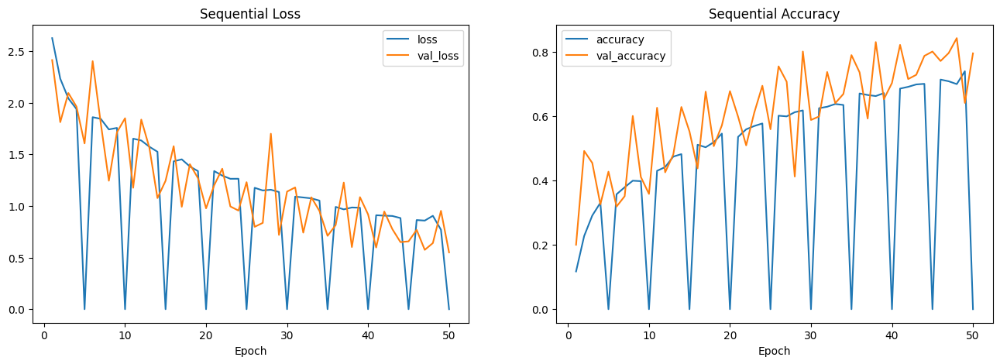

In [ ]:
#shows loss and accuracy graph
epoch=50

fig, ax = plt.subplots(ncols=2,figsize=(16,5))
ax[0].plot(range(1,epoch+1),history.history['loss'],label='loss')
ax[0].plot(range(1,epoch+1),history.history['val_loss'],label='val_loss')
ax[0].set_title('Sequential Loss')
ax[0].legend()
ax[0].set_xlabel('Epoch')

ax[1].plot(range(1,epoch+1),history.history['accuracy'],label='accuracy')
ax[1].plot(range(1,epoch+1),history.history['val_accuracy'],label='val_accuracy')
ax[1].set_title('Sequential Accuracy')
ax[1].legend()
ax[1].set_xlabel('Epoch')

plt.show()

In [ ]:
#train evaluation
trains_loss, trains_acc = models.evaluate(train_gen)
print(f'Train loss Sequential: {trains_loss:.4f}')
print(f'Train accuracy Sequential: {trains_acc:.4f}')

#val evaluation
vals_loss, vals_acc = models.evaluate(val_gen)
print(f'Val loss Sequential: {vals_loss:.4f}')
print(f'Val accuracy Sequential: {vals_acc:.4f}')

120/120 ━━━━━━━━━━━━━━━━━━━━ 61s 505ms/step - accuracy: 0.7469 - loss: 0.6834
Train loss Sequential: 0.6757
Train accuracy Sequential: 0.7517
24/24 ━━━━━━━━━━━━━━━━━━━━ 12s 472ms/step - accuracy: 0.6564 - loss: 0.8771
Val loss Sequential: 0.7189
Val accuracy Sequential: 0.7377


In [ ]:
#shows classification report from test-set
preds = models.predict(test_gen)
preds = np.argmax(preds, axis=1)
true = test_gen.labels

print(classification_report(true,preds))

24/24 ━━━━━━━━━━━━━━━━━━━━ 12s 483ms/step
              precision    recall  f1-score   support

           0       0.76      0.39      0.51       200
           1       0.64      0.81      0.71       200
           2       0.54      0.81      0.65       200
           3       0.79      0.77      0.78       200
           4       0.84      0.71      0.77       200
           5       0.77      0.44      0.56       200
           6       0.99      0.90      0.94       200
           7       0.92      0.99      0.95       200
           8       0.54      0.86      0.66       200
           9       0.84      0.79      0.81       200
          10       0.96      0.39      0.56       200
          11       0.98      0.92      0.95       200
          12       0.65      0.86      0.74       200
          13       0.81      0.85      0.83       200
          14       0.76      0.81      0.78       200

    accuracy                           0.75      3000
   macro avg       0.79      0.75     

# Predict

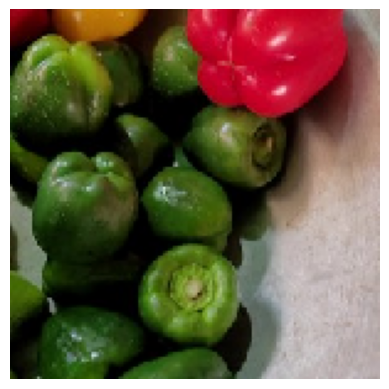

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 561ms/step
Result     :  [[0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
  0.0000000e+00 9.9389172e-01 0.0000000e+00 0.0000000e+00 0.0000000e+00
  6.1082984e-03 0.0000000e+00 0.0000000e+00 0.0000000e+00 1.8538993e-20]]
Max Class  :  6
Class Name :  Capsicum



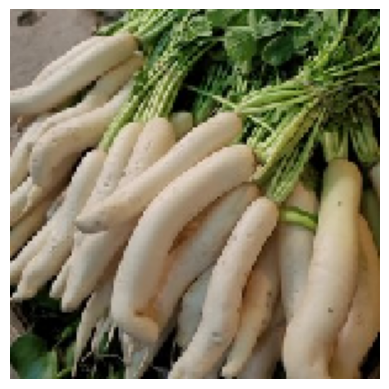

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
Result     :  [[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]]
Max Class  :  13
Class Name :  Radish



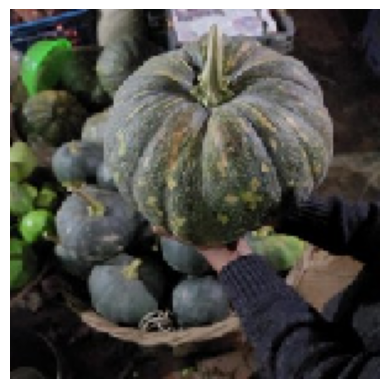

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
Result     :  [[0.00e+00 0.00e+00 0.00e+00 0.00e+00 0.00e+00 0.00e+00 0.00e+00 0.00e+00
  1.00e+00 0.00e+00 0.00e+00 0.00e+00 0.00e+00 0.00e+00 6.56e-43]]
Max Class  :  8
Class Name :  Cauliflower



In [ ]:
# define image size
img_height = 150
img_width = 150

# choose random images from test-set
img_paths = ['/content/drive/MyDrive/PCVK/Vegetable Images/test/Capsicum/1004.jpg',
             '/content/drive/MyDrive/PCVK/Vegetable Images/test/Radish/1043.jpg',
             '/content/drive/MyDrive/PCVK/Vegetable Images/test/Pumpkin/1129.jpg']

for filename in img_paths:
  img = image.load_img(filename, target_size=(img_height, img_width))
  plt.imshow(img)
  plt.axis('off')
  plt.show()

  img_array = tf.keras.preprocessing.image.img_to_array(img)
  img_batch = np.expand_dims(img_array, axis=0)

  #predict
  prediction = models.predict(img_batch)
  result_max_proba = prediction.argmax(axis=-1)[0]
  result_class = class_names[result_max_proba]

  print('Result     : ', prediction)
  print('Max Class  : ', result_max_proba)
  print('Class Name : ', result_class)
  print('')

# VGG16

In [ ]:
#clear session
tf.keras.backend.clear_session()

In [ ]:
# Import Library
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import GlobalAveragePooling2D
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.applications.vgg16 import VGG16
from sklearn.metrics import classification_report
from tensorflow.keras.preprocessing import image

In [ ]:
#define image size
img_height = 150
img_width = 150
inputs= [img_height,img_width,3]

In [ ]:
#download VGG model
base_model = VGG16(include_top = False, weights = 'imagenet', input_shape = inputs)
base_model.trainable = False

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [ ]:
#model definition
base_model = Sequential([base_model,
                         GlobalAveragePooling2D(),
                         Dense(512, activation = 'relu'),
                         BatchNormalization(),
                         Dropout(0.3),
                         Dense(1024, activation = 'relu'),
                         Dropout(0.15),
                         Dense(2048, activation = 'relu'),
                         Dropout(0.3),
                         Dense(15, activation = 'softmax')
                         ])

In [ ]:
#shows model sumary
base_model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ vgg16 (Functional)                   │ (None, 4, 4, 512)           │      14,714,688 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 512)                 │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 512)                 │         262,656 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 512)                 │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 1024)                │         525,312 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 1024)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 2048)                │       2,099,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 2048)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 15)                  │          30,735 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 17,634,639 (67.27 MB)

 Trainable params: 2,918,927 (11.13 MB)

 Non-trainable params: 14,715,712 (56.14 MB)

In [ ]:
#model training
base_model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

history_vgg = base_model.fit(train_gen, epochs=50, steps_per_epoch = 30, validation_data = val_gen, verbose = 1, validation_steps=10)


Epoch 1/50
30/30 ━━━━━━━━━━━━━━━━━━━━ 31s 802ms/step - accuracy: 0.8338 - loss: 0.5334 - val_accuracy: 0.6405 - val_loss: 1.3899
Epoch 2/50
30/30 ━━━━━━━━━━━━━━━━━━━━ 22s 763ms/step - accuracy: 0.9279 - loss: 0.2278 - val_accuracy: 0.9524 - val_loss: 0.7017
Epoch 3/50
30/30 ━━━━━━━━━━━━━━━━━━━━ 33s 1s/step - accuracy: 0.9428 - loss: 0.1719 - val_accuracy: 0.9062 - val_loss: 0.6944
Epoch 4/50


/usr/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


30/30 ━━━━━━━━━━━━━━━━━━━━ 19s 664ms/step - accuracy: 0.9557 - loss: 0.1299 - val_accuracy: 0.8611 - val_loss: 0.5824
Epoch 5/50
30/30 ━━━━━━━━━━━━━━━━━━━━ 6s 191ms/step - accuracy: 0.0000e+00 - loss: 0.0000e+00 - val_accuracy: 0.8643 - val_loss: 0.5208
Epoch 6/50
30/30 ━━━━━━━━━━━━━━━━━━━━ 21s 581ms/step - accuracy: 0.9567 - loss: 0.1400 - val_accuracy: 0.9479 - val_loss: 0.2858
Epoch 7/50
30/30 ━━━━━━━━━━━━━━━━━━━━ 22s 754ms/step - accuracy: 0.9730 - loss: 0.0932 - val_accuracy: 0.9508 - val_loss: 0.2699
Epoch 8/50
30/30 ━━━━━━━━━━━━━━━━━━━━ 21s 731ms/step - accuracy: 0.9656 - loss: 0.1086 - val_accuracy: 0.9611 - val_loss: 0.2038
Epoch 9/50
30/30 ━━━━━━━━━━━━━━━━━━━━ 13s 424ms/step - accuracy: 0.9716 - loss: 0.0876 - val_accuracy: 0.9583 - val_loss: 0.1482
Epoch 10/50
30/30 ━━━━━━━━━━━━━━━━━━━━ 6s 196ms/step - accuracy: 0.0000e+00 - loss: 0.0000e+00 - val_accuracy: 0.9603 - val_loss: 0.1387
Epoch 11/50
30/30 ━━━━━━━━━━━━━━━━━━━━ 25s 708ms/step - accuracy: 0.9714 - loss: 0.0920 - val

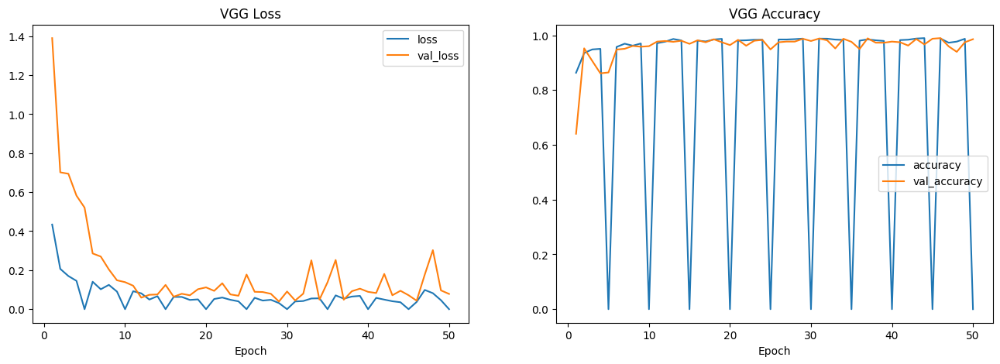

In [ ]:
#shows loss and accuracy graph
epoch=50

fig, ax = plt.subplots(ncols=2,figsize=(16,5))
ax[0].plot(range(1,epoch+1),history_vgg.history['loss'],label='loss')
ax[0].plot(range(1,epoch+1),history_vgg.history['val_loss'],label='val_loss')
ax[0].set_title('VGG Loss')
ax[0].legend()
ax[0].set_xlabel('Epoch')
# ax[0].set_ylim(0,0.01)

ax[1].plot(range(1,epoch+1),history_vgg.history['accuracy'],label='accuracy')
ax[1].plot(range(1,epoch+1),history_vgg.history['val_accuracy'],label='val_accuracy')
ax[1].set_title('VGG Accuracy')
ax[1].legend()
ax[1].set_xlabel('Epoch')
# ax[1].set_ylim(0.5,1.5)

plt.show()

In [ ]:
#train evaluation
trainvgg_loss, trainvgg_acc = base_model.evaluate(train_gen)
print(f'Train loss VGG: {trainvgg_loss:.4f}')
print(f'Train accuracy VGG: {trainvgg_acc:.4f}')

#val evaluation
valvgg_loss, valvgg_acc = base_model.evaluate(val_gen)
print(f'Val loss VGG: {valvgg_loss:.4f}')
print(f'Val accuracy VGG: {valvgg_acc:.4f}')

120/120 ━━━━━━━━━━━━━━━━━━━━ 63s 527ms/step - accuracy: 0.9902 - loss: 0.0313
Train loss VGG: 0.0314
Train accuracy VGG: 0.9909
24/24 ━━━━━━━━━━━━━━━━━━━━ 13s 521ms/step - accuracy: 0.9780 - loss: 0.0906
Val loss VGG: 0.0963
Val accuracy VGG: 0.9773


In [ ]:
#shows classification report from test-set
predvgg = base_model.predict(test_gen)
predvgg = np.argmax(predvgg, axis=1)
true = test_gen.labels

print(classification_report(true,predvgg))

24/24 ━━━━━━━━━━━━━━━━━━━━ 13s 488ms/step
              precision    recall  f1-score   support

           0       1.00      0.97      0.98       200
           1       0.99      0.99      0.99       200
           2       0.98      1.00      0.99       200
           3       0.97      0.94      0.95       200
           4       0.99      0.98      0.99       200
           5       1.00      0.96      0.98       200
           6       0.93      1.00      0.96       200
           7       0.97      1.00      0.99       200
           8       0.98      0.98      0.98       200
           9       0.99      0.97      0.98       200
          10       0.95      0.96      0.96       200
          11       0.99      1.00      1.00       200
          12       0.99      0.96      0.98       200
          13       0.98      0.98      0.98       200
          14       0.98      0.98      0.98       200

    accuracy                           0.98      3000
   macro avg       0.98      0.98     

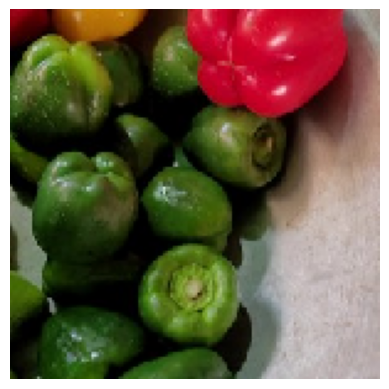

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
Result     :  [[0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]]
Max Class  :  6
Class Name :  Capsicum



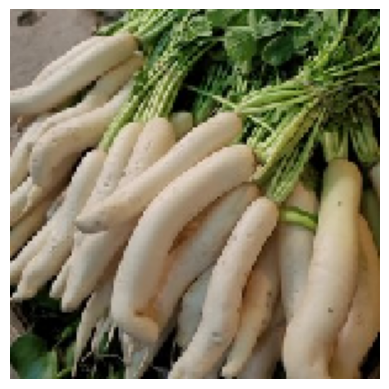

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
Result     :  [[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]]
Max Class  :  13
Class Name :  Radish



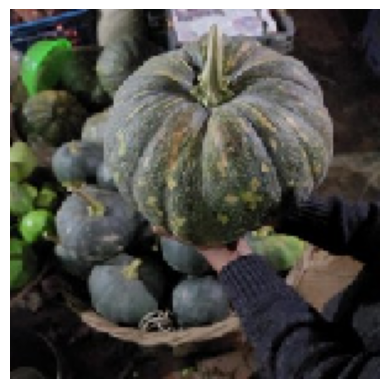

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
Result     :  [[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]]
Max Class  :  12
Class Name :  Pumpkin



In [ ]:
#define image size
img_height = 150
img_width = 150

#choose random images from test-set
img_paths = ['/content/drive/MyDrive/PCVK/Vegetable Images/test/Capsicum/1004.jpg',
             '/content/drive/MyDrive/PCVK/Vegetable Images/test/Radish/1043.jpg',
             '/content/drive/MyDrive/PCVK/Vegetable Images/test/Pumpkin/1129.jpg']

for filename in img_paths:
  img = image.load_img(filename, target_size=(img_height, img_width))
  plt.imshow(img)
  plt.axis('off')
  plt.show()

  img_array = tf.keras.preprocessing.image.img_to_array(img)
  img_batch = np.expand_dims(img_array, axis=0)

  #predict
  prediction = base_model.predict(img_batch)
  result_max_proba = prediction.argmax(axis=-1)[0]
  result_class = class_names[result_max_proba]

  print('Result     : ', prediction)
  print('Max Class  : ', result_max_proba)
  print('Class Name : ', result_class)
  print('')

In [ ]:
# Save Model
base_model.save('model_vgg.h5')